Ignore extra AI types until end. I'd started them early, but didn't want to troubleshoot until I needed. So some of the earlier ones may not work, but they work when needed for 10, and are just unnecessary before.

# Lab 6

You are tasked with evaluating card counting strategies for black jack. In order to do so, you will use object oriented programming to create a playable casino style black jack game where a computer dealer plays against $n$ computer players and possibily one human player. If you don't know the rules of blackjack or card counting, please google it. 

A few requirements:
* The game should utilize multiple 52-card decks. Typically the game is played with 6 decks.
* Players should have chips.
* Dealer's actions are predefined by rules of the game (typically hit on 16). 
* The players should be aware of all shown cards so that they can count cards.
* Each player could have a different strategy.
* The system should allow you to play large numbers of games, study the outcomes, and compare average winnings per hand rate for different strategies.

1. Begin by creating a classes to represent cards and decks. The deck should support more than one 52-card set. The deck should allow you to shuffle and draw cards. Include a "plastic" card, placed randomly in the deck. Later, when the plastic card is dealt, shuffle the cards before the next deal.

In [202]:
import copy


class Deck:
    suits = ['Hearts', 'Diamonds', 'Clubs', 'Spades']
    ranks = ['2', '3', '4', '5', '6', '7', '8', '9', '10', 'J', 'Q', 'K', 'A']
    values = {'2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '10': 10, 
              'J': 10, 'Q': 10, 'K': 10, 'A': 11}
    

    def __init__(self, num_decks=6):
        self.full_deck=[]
        self.num_decks=num_decks
        self.cards = [Card(suit, rank, self.values[rank]) for suit in self.suits for rank in self.ranks] * num_decks
        self.shuffle()
        
        
    def shuffle(self):
        if self.full_deck==[]:
            self.full_deck=copy.deepcopy(self.cards)
        else:
            self.cards=copy.deepcopy(self.full_deck)
        random.shuffle(self.cards)
        self.cards.insert(random.randint(len(self.cards) // 4, 3 * len(self.cards) // 4), Card("P", "P", 0))


    def draw_card(self):
        print(self.cards[-1])
        if self.cards[-1].rank=="P":
            print("Plastic card reached. Reshuffling deck.")
            self.__init__(self.num_decks)
        return self.cards.pop()
    
class Card:
    def __init__(self, suit, rank, value):
        self.suit = suit
        self.rank = rank
        self.value = value

    def __repr__(self):
        return f"{self.rank} of {self.suit}"
    
DeckTest=Deck()
DeckTest.draw_card()
DeckTest.shuffle()
DeckTest.draw_card()


J of Diamonds
K of Hearts


K of Hearts

2. Now design your game on a UML diagram. You may want to create classes to represent, players, a hand, and/or the game. As you work through the lab, update your UML diagram. At the end of the lab, submit your diagram (as pdf file) along with your notebook. 

3. Begin with implementing the skeleton (ie define data members and methods/functions, but do not code the logic) of the classes in your UML diagram.

4. Complete the implementation by coding the logic of all functions. For now, just implement the dealer player and human player.

In [203]:
import random
import time

class Player:
    def __init__(self, name, chips=1000):
        self.chips = chips
        self.hand = []
        self.name = name
    
    def receive_card(self, card):
        self.hand.append(card)

    def show_hand(self):
        return ", ".join(map(str, self.hand))

    def hand_value(self):
        value = sum(card.value for card in self.hand)
        num_aces = sum(1 for card in self.hand if card.rank == 'A')
        while value > 21 and num_aces:
            value -= 10  # Devalues Ace when appropriate
            num_aces -= 1
        return value
    
class BlackjackGame:
    def __init__(self, decks=6, num_players=1, human_player=True):
        
        if not human_player and num_players < 1:
            raise ValueError("Error: At least one player must be present to start the game.")
        if num_players<0:
            raise ValueError("Error: You cannot have a negative number of players")
        
        self.deck = Deck(decks)
        self.deck.shuffle()
        self.players = []
        self.dealer = Player("Dealer")
        self.human_player = human_player

        for i in range(num_players):
            self.players.append(Player(f"Player{i+1}"))

        if human_player:
            self.players.insert(0, Player("Player0"))

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                player.receive_card(self.deck.draw_card())
            self.dealer.receive_card(self.deck.draw_card())
            print(self.display_table())
            time.sleep(1)
            print("-----------")

    def display_table(self, show_dealer=False):
        print("\nDealer's Hand:")
        if show_dealer:
            print(self.dealer.show_hand(), f"({self.dealer.hand_value()})")
        else:
            print("  Showing",self.dealer.hand[0], "|| Total: (??)")

        for player in self.players:
            print(f"{player.name}'s Hand:\n   {player.show_hand()} || Total: ({player.hand_value()})")

    def player_turn(self, player):
        while player.hand_value() < 21:
            if player.name == "Player0":
                action = input(f"---------------------\n{player.name}, you're currently at {player.hand_value()}. Dealer is showing {self.dealer.hand[0]}, \nDo you want to hit (h) or stand (s)? ").lower()
            else:
                action = "h" if player.hand_value() < 16 else random.choice(["h", "s"])
            #if AI hits less than 16 and has 50/50 to hit above that.
            
            if action != "h" and action != "s":
                print ("That is not a proper response, please enter either 'h' or 's' only.")
                
            elif action == "h":
                player.receive_card(self.deck.draw_card())
                print(f"{player.name} hits: {player.show_hand()} ({player.hand_value()})")
                if player.hand_value() > 21:
                    print(f"{player.name} busts!")
                    break
                if player.name != "Player0" and player.hand_value() > 16:
                    break
                #AI stays when new total is over 16 after hit
                
            else:
                print(f"{player.name} stands.")
                break

    def dealer_turn(self):
        print("\nDealer's turn:")
        self.display_table(show_dealer=True)
        while self.dealer.hand_value() < 17:
            time.sleep(1)  # SUSPENSE
            self.dealer.receive_card(self.deck.draw_card())
            print(f"Dealer hits: {self.dealer.show_hand()} ({self.dealer.hand_value()})")

        if self.dealer.hand_value() > 21:
            time.sleep(1)
            print("Dealer busts!")

    def determine_winners(self):
        dealer_value = self.dealer.hand_value()
        print("\n~~~~~~~~~~~~~~~~\n~~~~~~~~~~~~~~~~\nResults:\n----------------")
        for player in self.players:
            player_value = player.hand_value()
            if player_value > 21:
                print(f"{player.name} busts and loses.")
            elif dealer_value > 21 or player_value > dealer_value:
                print(f"{player.name} wins!")
                player.chips += 100
            elif player_value < dealer_value:
                print(f"{player.name} loses.")
                player.chips -= 100
            else:
                print(f"{player.name} pushes.")
        

    def reset_hands(self):
        for player in self.players + [self.dealer]:
            player.hand = []

    def play(self, num_rounds=1):
        for _ in range(num_rounds):
            print("\n---------------------\n   New round begins in:")
            print("")
            for i in range(4):
                print(3-i)
                time.sleep(1)
            self.reset_hands()
            self.initial_deal()
            #self.display_table()

            # Player turns
            for player in self.players:
                self.player_turn(player)

            # Dealer's turn
            self.dealer_turn()

            # Determine winners
            self.determine_winners()


5.  Test. Demonstrate game play. For example, create a game of several dealer players and show that the game is functional through several rounds.

In [204]:
game = BlackjackGame(num_players=1, human_player=True)
game.play(num_rounds=5)


---------------------
   New round begins in:

3
2
1
0
9 of Diamonds
8 of Hearts
2 of Diamonds

Dealer's Hand:
  Showing 2 of Diamonds || Total: (??)
Player0's Hand:
   9 of Diamonds || Total: (9)
Player1's Hand:
   8 of Hearts || Total: (8)
None
-----------
7 of Hearts
4 of Clubs
K of Spades

Dealer's Hand:
  Showing 2 of Diamonds || Total: (??)
Player0's Hand:
   9 of Diamonds, 7 of Hearts || Total: (16)
Player1's Hand:
   8 of Hearts, 4 of Clubs || Total: (12)
None
-----------
---------------------
Player0, you're currently at 16. Dealer is showing 2 of Diamonds, 
Do you want to hit (h) or stand (s)? h
2 of Spades
Player0 hits: 9 of Diamonds, 7 of Hearts, 2 of Spades (18)
---------------------
Player0, you're currently at 18. Dealer is showing 2 of Diamonds, 
Do you want to hit (h) or stand (s)? s
Player0 stands.
3 of Spades
Player1 hits: 8 of Hearts, 4 of Clubs, 3 of Spades (15)
10 of Spades
Player1 hits: 8 of Hearts, 4 of Clubs, 3 of Spades, 10 of Spades (25)
Player1 busts!

Deal

In [205]:
game = BlackjackGame(num_players=1, human_player=False)
game.play(num_rounds=5)


---------------------
   New round begins in:

3
2
1
0
4 of Spades
A of Hearts

Dealer's Hand:
  Showing A of Hearts || Total: (??)
Player1's Hand:
   4 of Spades || Total: (4)
None
-----------
3 of Spades
Q of Clubs

Dealer's Hand:
  Showing A of Hearts || Total: (??)
Player1's Hand:
   4 of Spades, 3 of Spades || Total: (7)
None
-----------
A of Clubs
Player1 hits: 4 of Spades, 3 of Spades, A of Clubs (18)

Dealer's turn:

Dealer's Hand:
A of Hearts, Q of Clubs (21)
Player1's Hand:
   4 of Spades, 3 of Spades, A of Clubs || Total: (18)

~~~~~~~~~~~~~~~~
~~~~~~~~~~~~~~~~
Results:
----------------
Player1 loses.

---------------------
   New round begins in:

3
2
1
0
6 of Spades
7 of Spades

Dealer's Hand:
  Showing 7 of Spades || Total: (??)
Player1's Hand:
   6 of Spades || Total: (6)
None
-----------
Q of Hearts
Q of Diamonds

Dealer's Hand:
  Showing 7 of Spades || Total: (??)
Player1's Hand:
   6 of Spades, Q of Hearts || Total: (16)
None
-----------
9 of Spades
Player1 hits: 6 o

6. Implement a new player with the following strategy:

    * Assign each card a value: 
        * Cards 2 to 6 are +1 
        * Cards 7 to 9 are 0 
        * Cards 10 through Ace are -1
    * Compute the sum of the values for all cards seen so far.
    * Hit if sum is very negative, stay if sum is very positive. Select a threshold for hit/stay, e.g. 0 or -2.  

In [200]:
import random
import time
import copy

class Player:
    def __init__(self, name, chips=1000):
        self.chips = chips
        self.hand = []
        self.name = name
    
    def receive_card(self, card):
        self.hand.append(card)

    def show_hand(self):
        return ", ".join(map(str, self.hand))

    def hand_value(self):
        value = sum(card.value for card in self.hand)
        num_aces = sum(1 for card in self.hand if card.rank == 'A')
        while value > 21 and num_aces:
            value -= 10  # Devalues Ace when appropriate
            num_aces -= 1
        return value
    
class PlayerD(Player):
    #dealer strat
    def hit_or_stay(self):
        return self.hand_value() < 17
    
class Player1(Player):
    #Hi/Low
    def __init__(self, name, chips=1000):
        super().__init__(name, chips)
        self.count = 0
        
    def update_count(self, card):
        while card is None:  # Plastic card was drawn, meaning deck reshuffled
            print("Deck reshuffled! Resetting counts.")
            for player in self.card_counters:
                player.count = 0
                print(f"{player.name}'s count reset.")
                
            
        if card.rank in ['2', '3', '4', '5', '6']:
            self.count += 1
        elif card.rank in ['10', 'J', 'Q', 'K', 'A']:
            self.count -= 1
        print ("current count:",self.count)
        
    def hit_or_stay(self):
        if self.count>=4:
            return self.hand_value()<12
        elif self.count<=-4:
            return self.hand_value()<18
        else:
            return self.hand_value()<16
    
class Player2(Player):
    #50/50 over 16
    def hit_or_stay(self):
        return self.hand_value() < 16 or random.choice([True, False])
    
class Player3(Player):
    #Cheat
    def hit_or_stay(self, deck):
        next_card = deck.cards[-1]  # Peek at the next card
        return self.hand_value() + next_card.value <= 21
    
    
    
class BlackjackGame:
    def __init__(self, decks=6, num_players=1, human_player=True):
        
        if not human_player and num_players < 1:
            raise ValueError("Error: At least one player must be present to start the game.")
        if num_players<0:
            raise ValueError("Error: You cannot have a negative number of players")
        
        ai_classes = {"1": PlayerD,# Dealer strategy 
                      "2": Player1,# Hi/Lo Card Counter
                        "3": Player2,# 50/50 over 16
                        "4": Player3 # Cheats
                     }
        self.deck = Deck(decks)
        self.deck.game = self
        self.card_counters = []
        self.deck.shuffle()
        self.players = []
        self.dealer = Player("Dealer")
        self.human_player = human_player
        self.dealer_card= []
        
        if num_players>0:
            self.specify=input("Would you like to specify strategies for AI? (y) or (n)?")
        
        for i in range(num_players):
            if self.specify=="y":
                print("AI strategies:\n1. Dealer strategy\n2. Hi/Low\n3. 50/50 over 16\n4. Cheats")
                choice = input(f"Select strategy for AI Player {i+1}: ")
                while choice not in ai_classes:
                    choice= input("That is an invalid choice, please select a strategy (1-4): ")
                ai_class = ai_classes[choice]
         
            else:
                ai_class = random.choice(list(ai_classes.values()))
            
            ai_player = ai_class(f"AI Player {i+1}")
            self.players.append(ai_player)
            
            if isinstance(ai_player, Player1):
                self.card_counters.append(ai_player)

        if human_player:
            self.players.insert(0, Player("You"))

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                card=self.deck.draw_card()
                player.receive_card(card)
                self.update_counts(card)
        self.dealer_card = self.deck.draw_card()    
        self.dealer.receive_card(self.dealer_card)
        self.update_counts(self.dealer_card)
        self.dealer_card = self.deck.draw_card()
        self.dealer.receive_card(self.dealer_card)
        #time.sleep(1)
        print("-----------")
            
    def update_counts(self, card):
        for player in self.card_counters:
            player.update_count(card)

    def display_table(self, show_dealer=False):
        print("\nDealer's Hand:")
        if show_dealer:
            print(self.dealer.show_hand(), f"({self.dealer.hand_value()})")
        else:
            print("  Showing",self.dealer.hand[0], "|| Total: (??)")

        for player in self.players:
            print(f"{player.name}'s Hand:\n   {player.show_hand()} || Total: ({player.hand_value()})")

    def player_turn(self, player):
        while player.hand_value() < 21:
            if player.name == "You":
                action = input(f"---------------------\nYou're currently at {player.hand_value()}. Dealer is showing {self.dealer.hand[0]}, \nDo you want to hit (h) or stand (s)? ").lower()
            else:
                action = "h" if player.hit_or_stay() else "s"
            
            if action != "h" and action != "s":
                print ("That is not a proper response, please enter either 'h' or 's' only.")
                
            elif action == "h":
                card = self.deck.draw_card()
                player.receive_card(card)
                print(f"{player.name} hits: {player.show_hand()} ({player.hand_value()})")
                
                self.update_counts(card)
                
                if player.hand_value() > 21:
                    print(f"{player.name} busted!")
                    break
                
            else:
                print(f"{player.name} chose stand.")
                break

    def dealer_turn(self):
        print("\nDealer's turn:")
        self.display_table(show_dealer=True)
        self.update_counts(self.dealer_card)
        while self.dealer.hand_value() < 17:
            #time.sleep(1)
            self.dealer_card=self.deck.draw_card()
            self.update_counts(self.dealer_card)
            self.dealer.receive_card(self.dealer_card)
            
            print(f"Dealer hits: {self.dealer.show_hand()} ({self.dealer.hand_value()})")

        if self.dealer.hand_value() > 21:
            #time.sleep(1)
            print("Dealer busts!")

    def determine_winners(self):
        dealer_value = self.dealer.hand_value()
        print("\n~~~~~~~~~~~~~~~~\n~~~~~~~~~~~~~~~~\nResults:\n----------------")
        for player in self.players:
            player_value = player.hand_value()
            if player_value > 21:
                print(f"{player.name} busts and loses.")
            elif dealer_value > 21 or player_value > dealer_value:
                print(f"{player.name} wins!")
                player.chips += 50
            elif player_value < dealer_value:
                print(f"{player.name} loses.")
                player.chips -= 50
            else:
                print(f"{player.name} pushes.")
            print(f"{player.name} has {player.chips} chips.")
            if player.chips < 50:
                print(f"{player.name} no longer has enough chips for the ante")
            
        self.players= [player for player in self.players if player.chips>50]
        

    def reset_hands(self):
        for player in self.players + [self.dealer]:
            player.hand = []

    def play(self, num_rounds=1):
        for i in range(num_rounds):
            print(f"\n---------------------\n   Round {i+1} beginning:")
            print("")
            #for i in range(4):
                #print(3-i)
                #time.sleep(1)
            self.reset_hands()
            self.initial_deal()
            #self.display_table()

            # Player turns
            for player in self.players:
                self.player_turn(player)

            # Dealer's turn
            self.dealer_turn()

            # Determine winners
            self.determine_winners()
            if not self.players and not self.human_player:
                print("All players are out of chips. Game over!")
                return False  # Stops the game loop

class Deck:
    suits = ['Hearts', 'Diamonds', 'Clubs', 'Spades']
    ranks = ['2', '3', '4', '5', '6', '7', '8', '9', '10', 'J', 'Q', 'K', 'A']
    values = {'2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '10': 10, 
              'J': 10, 'Q': 10, 'K': 10, 'A': 11}
    

    def __init__(self, num_decks=6):
        self.full_deck=[]
        self.num_decks=num_decks
        self.cards = [Card(suit, rank, self.values[rank]) for suit in self.suits for rank in self.ranks] * num_decks
        self.shuffle()

        
    def shuffle(self):
        if self.full_deck==[]:
            self.full_deck=copy.deepcopy(self.cards)
            print("Shuffling deck")
        else:
            self.cards=copy.deepcopy(self.full_deck)
            
        if hasattr(self, 'game') and self.game:
                for player in self.game.card_counters:
                    player.count = 0
                    print(f"{player.name}'s count reset due to shuffle.") 
        random.shuffle(self.cards)
        self.cards.insert(random.randint(len(self.cards) // 4, 3 * len(self.cards) // 4), Card("P", "P", 0))


    def draw_card(self):
        print(self.cards[-1])
        if self.cards[-1].rank=="P":
            print("Plastic card reached. Reshuffling deck.")
            self.shuffle()
        print("remaining cards:", len(self.cards))
        return self.cards.pop()

    
class Card:
    def __init__(self, suit, rank, value):
        self.suit = suit
        self.rank = rank
        self.value = value

    def __repr__(self):
        return f"{self.rank} of {self.suit}"

7. Create a test scenario where one player, using the above strategy, is playing with a dealer and 3 other players that follow the dealer's strategy. Each player starts with same number of chips. Play 50 rounds (or until the strategy player is out of money). Compute the strategy player's winnings. You may remove unnecessary printouts from your code (perhaps implement a verbose/quiet mode) to reduce the output.

In [201]:
game = BlackjackGame(num_players=4, human_player=False)
game.play(num_rounds=50)

Shuffling deck
Would you like to specify strategies for AI? (y) or (n)?n

---------------------
   Round 1 beginning:

7 of Clubs
remaining cards: 313
current count: 0
current count: 0
A of Spades
remaining cards: 312
current count: -1
current count: -1
J of Spades
remaining cards: 311
current count: -2
current count: -2
Q of Diamonds
remaining cards: 310
current count: -3
current count: -3
2 of Clubs
remaining cards: 309
current count: -2
current count: -2
4 of Hearts
remaining cards: 308
current count: -1
current count: -1
5 of Hearts
remaining cards: 307
current count: 0
current count: 0
J of Hearts
remaining cards: 306
current count: -1
current count: -1
Q of Diamonds
remaining cards: 305
current count: -2
current count: -2
K of Hearts
remaining cards: 304
-----------


TypeError: Player3.hit_or_stay() missing 1 required positional argument: 'deck'

8. Create a loop that runs 100 games of 50 rounds, as setup in previous question, and store the strategy player's chips at the end of the game (aka "winnings") in a list. Histogram the winnings. What is the average winnings per round? What is the standard deviation. What is the probabilty of net winning or lossing after 50 rounds?


In [209]:
import random
import time
import copy

class Player:
    def __init__(self, name, chips=1000):
        self.chips = chips
        self.hand = []
        self.name = name
    
    def receive_card(self, card):
        self.hand.append(card)

    def show_hand(self):
        return ", ".join(map(str, self.hand))

    def hand_value(self):
        value = sum(card.value for card in self.hand)
        num_aces = sum(1 for card in self.hand if card.rank == 'A')
        while value > 21 and num_aces:
            value -= 10  # Devalues Ace when appropriate
            num_aces -= 1
        return value
    
class PlayerD(Player):
    #dealer strat
    def hit_or_stay(self):
        return self.hand_value() < 17
    
class Player1(Player):
    #Hi/Low
    def __init__(self, name, chips=1000):
        super().__init__(name, chips)
        self.count = 0
        
    def update_count(self, card):
        while card is None:  # Plastic card was drawn, meaning deck reshuffled
            print("Deck reshuffled! Resetting counts.")
            for player in self.card_counters:
                player.count = 0
                print(f"{player.name}'s count reset.")
                
            
        if card.rank in ['2', '3', '4', '5', '6']:
            self.count += 1
        elif card.rank in ['10', 'J', 'Q', 'K', 'A']:
            self.count -= 1
        print ("current count:",self.count)
        
    def hit_or_stay(self):
        if self.count>=4:
            return self.hand_value()<12
        elif self.count<=-4:
            return self.hand_value()<18
        else:
            return self.hand_value()<16
    
class Player2(Player):
    #50/50 over 16
    def hit_or_stay(self):
        return self.hand_value() < 16 or random.choice([True, False])
    
class Player3(Player):
    #Cheater
    def hit_or_stay(self, deck):
        next_card = deck.cards[-1]  # Peek at the next card
        if next_card.value==11:
            return self.hand_value() + 11 <=21 or self.hand_value+1<=11
        else:
            return self.hand_value() + next_card.value <= 21
    
    
class BlackjackGame:
    def __init__(self, decks=6, num_players=1, human_player=True):
        
        if not human_player and num_players < 1:
            raise ValueError("Error: At least one player must be present to start the game.")
        if num_players<0:
            raise ValueError("Error: You cannot have a negative number of players")
        
        ai_classes = {"1": PlayerD,# Dealer strategy 
                      "2": Player1,# Hi/Lo Card Counter
                        "3": Player2,# 50/50 over 16
                        "4": Player3 # Cheats
                     }
        self.deck = Deck(decks)
        self.deck.game = self
        self.card_counters = []
        self.deck.shuffle()
        self.players = []
        self.dealer = Player("Dealer")
        self.human_player = human_player
        self.dealer_card= []
        
        
        self.players.append(Player1("Guineapig"))
        self.players.append(PlayerD("P1"))
        self.players.append(PlayerD("P2"))
        self.players.append(PlayerD("P3"))
        self.card_counters.append(Player1("Guineapig"))

        if human_player:
            self.players.insert(0, Player("You"))

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                card=self.deck.draw_card()
                player.receive_card(card)
                self.update_counts(card)
        self.dealer_card = self.deck.draw_card()    
        self.dealer.receive_card(self.dealer_card)
        self.update_counts(self.dealer_card)
        self.dealer_card = self.deck.draw_card()
        self.dealer.receive_card(self.dealer_card)
        #time.sleep(1)
        print("-----------")
            
    def update_counts(self, card):
        for player in self.card_counters:
            player.update_count(card)

    def display_table(self, show_dealer=False):
        print("\nDealer's Hand:")
        if show_dealer:
            print(self.dealer.show_hand(), f"({self.dealer.hand_value()})")
        else:
            print("  Showing",self.dealer.hand[0], "|| Total: (??)")

        for player in self.players:
            print(f"{player.name}'s Hand:\n   {player.show_hand()} || Total: ({player.hand_value()})")

    def player_turn(self, player):
        while player.hand_value() < 21:
            if player.name == "You":
                action = input(f"---------------------\nYou're currently at {player.hand_value()}. Dealer is showing {self.dealer.hand[0]}, \nDo you want to hit (h) or stand (s)? ").lower()
            else:
                action = "h" if player.hit_or_stay() else "s"
            
            if action != "h" and action != "s":
                print ("That is not a proper response, please enter either 'h' or 's' only.")
                
            elif action == "h":
                card = self.deck.draw_card()
                player.receive_card(card)
                print(f"{player.name} hits: {player.show_hand()} ({player.hand_value()})")
                
                self.update_counts(card)
                
                if player.hand_value() > 21:
                    print(f"{player.name} busted!")
                    break
                
            else:
                print(f"{player.name} chose stand.")
                break

    def dealer_turn(self):
        print("\nDealer's turn:")
        self.display_table(show_dealer=True)
        self.update_counts(self.dealer_card)
        while self.dealer.hand_value() < 17:
            #time.sleep(1)
            self.dealer_card=self.deck.draw_card()
            self.update_counts(self.dealer_card)
            self.dealer.receive_card(self.dealer_card)
            
            print(f"Dealer hits: {self.dealer.show_hand()} ({self.dealer.hand_value()})")

        if self.dealer.hand_value() > 21:
            #time.sleep(1)
            print("Dealer busts!")

    def determine_winners(self):
        dealer_value = self.dealer.hand_value()
        print("\n~~~~~~~~~~~~~~~~\n~~~~~~~~~~~~~~~~\nResults:\n----------------")
        for player in self.players:
            player_value = player.hand_value()
            if player_value > 21:
                print(f"{player.name} busts and loses.")
                player.chips -= 50
            elif dealer_value > 21 or player_value > dealer_value:
                print(f"{player.name} wins!")
                player.chips += 50
            elif player_value < dealer_value:
                print(f"{player.name} loses.")
                player.chips -= 50
            else:
                print(f"{player.name} pushes.")
            print(f"{player.name} has {player.chips} chips.")
            if player.chips < 50:
                print(f"{player.name} no longer has enough chips for the ante")
            
        self.players= [player for player in self.players if player.chips>50]
        

    def reset_hands(self):
        for player in self.players + [self.dealer]:
            player.hand = []

    def play(self, num_rounds=1):
        for i in range(num_rounds):
            print(f"\n---------------------\n   Round {i+1} beginning:")
            print("")
            #for i in range(4):
                #print(3-i)
                #time.sleep(1)
            self.reset_hands()
            self.initial_deal()
            #self.display_table()

            # Player turns
            for player in self.players:
                self.player_turn(player)

            # Dealer's turn
            self.dealer_turn()

            # Determine winners
            self.determine_winners()
            if not self.players and not self.human_player:
                print("All players are out of chips. Game over!")
                return False  # Stops the game loop

class Deck:
    suits = ['Hearts', 'Diamonds', 'Clubs', 'Spades']
    ranks = ['2', '3', '4', '5', '6', '7', '8', '9', '10', 'J', 'Q', 'K', 'A']
    values = {'2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '10': 10, 
              'J': 10, 'Q': 10, 'K': 10, 'A': 11}
    

    def __init__(self, num_decks=6):
        self.full_deck=[]
        self.num_decks=num_decks
        self.cards = [Card(suit, rank, self.values[rank]) for suit in self.suits for rank in self.ranks] * num_decks
        self.shuffle()

        
    def shuffle(self):
        if self.full_deck==[]:
            self.full_deck=copy.deepcopy(self.cards)
            print("Shuffling deck")
        else:
            self.cards=copy.deepcopy(self.full_deck)
            
        if hasattr(self, 'game') and self.game:
                for player in self.game.card_counters:
                    player.count = 0
                    print(f"{player.name}'s count reset due to shuffle.") 
        random.shuffle(self.cards)
        self.cards.insert(random.randint(len(self.cards) // 4, 3 * len(self.cards) // 4), Card("P", "P", 0))


    def draw_card(self):
        print(self.cards[-1])
        if self.cards[-1].rank=="P":
            print("Plastic card reached. Reshuffling deck.")
            self.shuffle()
        print("remaining cards:", len(self.cards))
        return self.cards.pop()

    
class Card:
    def __init__(self, suit, rank, value):
        self.suit = suit
        self.rank = rank
        self.value = value

    def __repr__(self):
        return f"{self.rank} of {self.suit}"

In [210]:
def simulate_games(num_games=100, rounds_per_game=50):
    hi_lo_winnings = []  # List to store the Hi/Lo player's final chip count

    for game_num in range(num_games):
        print(f"\n=======================\nStarting Game {game_num + 1}...\n=======================")

        game = BlackjackGame(decks=6, num_players=1, human_player=False)  # 1 AI, no human playe

        game.play(num_rounds=rounds_per_game)  # Play 50 rounds

        # Store the Hi/Lo player's chip count at the end
        hi_lo_winnings.append(game.players[0].chips)

    return hi_lo_winnings
listedresults=simulate_games()


Starting Game 1...
Shuffling deck

---------------------
   Round 1 beginning:

A of Spades
remaining cards: 313
current count: -1
10 of Hearts
remaining cards: 312
current count: -2
9 of Clubs
remaining cards: 311
current count: -2
4 of Hearts
remaining cards: 310
current count: -1
Q of Diamonds
remaining cards: 309
current count: -2
6 of Spades
remaining cards: 308
current count: -1
10 of Diamonds
remaining cards: 307
current count: -2
4 of Spades
remaining cards: 306
current count: -1
3 of Diamonds
remaining cards: 305
current count: 0
9 of Hearts
remaining cards: 304
-----------
4 of Clubs
remaining cards: 303
P1 hits: 10 of Hearts, 6 of Spades, 4 of Clubs (20)
current count: 1
P1 chose stand.
P2 chose stand.
K of Hearts
remaining cards: 302
P3 hits: 4 of Hearts, 4 of Spades, K of Hearts (18)
current count: 0
P3 chose stand.

Dealer's turn:

Dealer's Hand:
3 of Diamonds, 9 of Hearts (12)
Guineapig's Hand:
   A of Spades, Q of Diamonds || Total: (21)
P1's Hand:
   10 of Hearts, 6 o

P1 wins!
P1 has 1000 chips.
P2 wins!
P2 has 1000 chips.
P3 wins!
P3 has 1000 chips.

---------------------
   Round 3 beginning:

8 of Spades
remaining cards: 282
current count: 7
5 of Diamonds
remaining cards: 281
current count: 8
7 of Clubs
remaining cards: 280
current count: 8
8 of Clubs
remaining cards: 279
current count: 8
3 of Clubs
remaining cards: 278
current count: 9
K of Spades
remaining cards: 277
current count: 8
8 of Hearts
remaining cards: 276
current count: 8
Q of Hearts
remaining cards: 275
current count: 7
10 of Hearts
remaining cards: 274
current count: 6
8 of Hearts
remaining cards: 273
-----------
9 of Clubs
remaining cards: 272
Guineapig hits: 8 of Spades, 3 of Clubs, 9 of Clubs (20)
current count: 6
Guineapig chose stand.
6 of Spades
remaining cards: 271
P1 hits: 5 of Diamonds, K of Spades, 6 of Spades (21)
current count: 7
2 of Hearts
remaining cards: 270
P2 hits: 7 of Clubs, 8 of Hearts, 2 of Hearts (17)
current count: 8
P2 chose stand.
P3 chose stand.

Dealer's

remaining cards: 197
current count: -10
4 of Hearts
remaining cards: 196
current count: -9
Q of Hearts
remaining cards: 195
current count: -10
A of Hearts
remaining cards: 194
current count: -11
7 of Spades
remaining cards: 193
current count: -11
8 of Clubs
remaining cards: 192
current count: -11
J of Diamonds
remaining cards: 191
current count: -12
J of Diamonds
remaining cards: 190
current count: -13
2 of Hearts
remaining cards: 189
current count: -12
9 of Diamonds
remaining cards: 188
-----------
Guineapig chose stand.
3 of Spades
remaining cards: 187
P1 hits: 4 of Hearts, 8 of Clubs, 3 of Spades (15)
current count: -11
J of Hearts
remaining cards: 186
P1 hits: 4 of Hearts, 8 of Clubs, 3 of Spades, J of Hearts (25)
current count: -12
P1 busted!
P2 chose stand.

Dealer's turn:

Dealer's Hand:
2 of Hearts, 9 of Diamonds (11)
Guineapig's Hand:
   Q of Clubs, 7 of Spades || Total: (17)
P1's Hand:
   4 of Hearts, 8 of Clubs, 3 of Spades, J of Hearts || Total: (25)
P2's Hand:
   Q of Hear

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [192]:
listedresults

[400,
 950,
 850,
 1150,
 650,
 1200,
 700,
 200,
 650,
 650,
 500,
 850,
 750,
 600,
 950,
 600,
 700,
 1050,
 1450,
 1050,
 700,
 600,
 450,
 700,
 950,
 1350,
 1000,
 300,
 250,
 650,
 1250,
 300,
 1250,
 550,
 600,
 500,
 1450,
 950,
 600,
 1200,
 1200,
 350,
 1300,
 450,
 650,
 1000,
 950,
 600,
 1000,
 450,
 1050,
 950,
 650,
 800,
 900,
 1000,
 800,
 650,
 1250,
 450,
 1100,
 1300,
 1500,
 650,
 800,
 550,
 750,
 1200,
 900,
 750,
 1200,
 150,
 850,
 150,
 550,
 850,
 500,
 300,
 1000,
 550,
 850,
 900,
 1000,
 600,
 800,
 950,
 1150,
 850,
 1000,
 300,
 600,
 850,
 850,
 700,
 850,
 700,
 950,
 850,
 700,
 350]

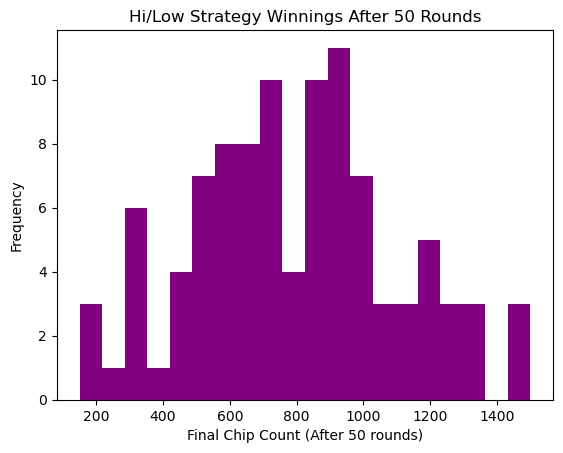

In [193]:
import matplotlib.pyplot as plt

plt.hist(listedresults, bins=20, color="Purple")
plt.xlabel("Final Chip Count (After 50 rounds)")
plt.ylabel("Frequency")
plt.title("Hi/Low Strategy Winnings After 50 Rounds")
plt.show()

In [194]:
import numpy as np

finals=np.array(results)
net_winnings=finals-1000

averagewinperROUND=np.mean(net_winnings)/50
std_dev = np.std(net_winnings)

win_prob = np.sum(net_winnings > 0) / 100
lose_prob = 1-win_prob

print(f"Average winnings PER ROUND: {averagewinperROUND}")
print(f"Standard deviation of final totals: {std_dev:.2f}")
print(f"Probability of winning: {win_prob}")
print(f"Probability of losing: {lose_prob}")

Average winnings PER ROUND: -4.55
Standard deviation of final totals: 351.74
Probability of winning: 0.27
Probability of losing: 0.73


9. Repeat previous questions scanning the value of the threshold. Try at least 5 different threshold values. Can you find an optimal value?

In [195]:
    
class Player1(Player):
    #Hi/Low
    def __init__(self, name, chips=1000, X=4, Y=-4, high_count_hand=12, low_count_hand=18):
        super().__init__(name, chips)
        self.count = 0
        self.X = X  # Threshold for high count
        self.Y = Y  # Threshold for low count
        self.high_count_hand = high_count_hand
        self.low_count_hand = low_count_hand
        
    def update_count(self, card):
        while card is None:  # Plastic card was drawn, meaning deck reshuffled
            print("Deck reshuffled! Resetting counts.")
            for player in self.card_counters:
                player.count = 0
                print(f"{player.name}'s count reset.")
                
            
        if card.rank in ['2', '3', '4', '5', '6']:
            self.count += 1
        elif card.rank in ['10', 'J', 'Q', 'K', 'A']:
            self.count -= 1
        print ("current count:",self.count)
        
    def hit_or_stay(self):
        if self.count >= self.X:
            return self.hand_value() < self.high_count_hand
        elif self.count <= self.Y:
            return self.hand_value() < self.low_count_hand
        else:
            return self.hand_value() < 16
 

class BlackjackGame:
    def __init__(self, decks=6, num_players=1, human_player=True):
        
        if not human_player and num_players < 1:
            raise ValueError("Error: At least one player must be present to start the game.")
        if num_players<0:
            raise ValueError("Error: You cannot have a negative number of players")
        
        ai_classes = {"1": PlayerD,# Dealer strategy 
                      "2": Player1,# Hi/Lo Card Counter
                        "3": Player2,# 50/50 over 16
                        "4": Player3 # Cheats
                     }
        self.deck = Deck(decks)
        self.deck.game = self
        self.card_counters = []
        self.deck.shuffle()
        self.players = []
        self.dealer = Player("Dealer")
        self.human_player = human_player
        self.dealer_card= []
        
        #self, name, chips=1000, X=8, Y=-8, high_count_hand=12, low_count_hand=18
        self.players.append(Player1("Guineapig",X=2, Y=-2, high_count_hand=12, low_count_hand=18))
        self.players.append(Player1("P1",X=3, Y=-3, high_count_hand=12, low_count_hand=18))
        self.players.append(Player1("P2",X=5, Y=-5, high_count_hand=12, low_count_hand=18))
        self.players.append(Player1("P3",X=6, Y=-6, high_count_hand=12, low_count_hand=18))
        self.card_counters.append(Player1("Guineapig"))
        self.card_counters.append(Player1("P1"))
        self.card_counters.append(Player1("P2"))
        self.card_counters.append(Player1("P3"))

        if human_player:
            self.players.insert(0, Player("You"))

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                card=self.deck.draw_card()
                player.receive_card(card)
                self.update_counts(card)
        self.dealer_card = self.deck.draw_card()    
        self.dealer.receive_card(self.dealer_card)
        self.update_counts(self.dealer_card)
        self.dealer_card = self.deck.draw_card()
        self.dealer.receive_card(self.dealer_card)
        #time.sleep(1)
        print("-----------")
            
    def update_counts(self, card):
        for player in self.card_counters:
            player.update_count(card)

    def display_table(self, show_dealer=False):
        print("\nDealer's Hand:")
        if show_dealer:
            print(self.dealer.show_hand(), f"({self.dealer.hand_value()})")
        else:
            print("  Showing",self.dealer.hand[0], "|| Total: (??)")

        for player in self.players:
            print(f"{player.name}'s Hand:\n   {player.show_hand()} || Total: ({player.hand_value()})")

    def player_turn(self, player):
        while player.hand_value() < 21:
            if player.name == "You":
                action = input(f"---------------------\nYou're currently at {player.hand_value()}. Dealer is showing {self.dealer.hand[0]}, \nDo you want to hit (h) or stand (s)? ").lower()
            else:
                action = "h" if player.hit_or_stay() else "s"
            
            if action != "h" and action != "s":
                print ("That is not a proper response, please enter either 'h' or 's' only.")
                
            elif action == "h":
                card = self.deck.draw_card()
                player.receive_card(card)
                print(f"{player.name} hits: {player.show_hand()} ({player.hand_value()})")
                
                self.update_counts(card)
                
                if player.hand_value() > 21:
                    print(f"{player.name} busted!")
                    break
                
            else:
                print(f"{player.name} chose stand.")
                break

    def dealer_turn(self):
        print("\nDealer's turn:")
        self.display_table(show_dealer=True)
        self.update_counts(self.dealer_card)
        while self.dealer.hand_value() < 17:
            #time.sleep(1)
            self.dealer_card=self.deck.draw_card()
            self.update_counts(self.dealer_card)
            self.dealer.receive_card(self.dealer_card)
            
            print(f"Dealer hits: {self.dealer.show_hand()} ({self.dealer.hand_value()})")

        if self.dealer.hand_value() > 21:
            #time.sleep(1)
            print("Dealer busts!")

    def determine_winners(self):
        dealer_value = self.dealer.hand_value()
        print("\n~~~~~~~~~~~~~~~~\n~~~~~~~~~~~~~~~~\nResults:\n----------------")
        for player in self.players:
            player_value = player.hand_value()
            if player_value > 21:
                print(f"{player.name} busts and loses.")
                player.chips -= 50
            elif dealer_value > 21 or player_value > dealer_value:
                print(f"{player.name} wins!")
                player.chips += 50
            elif player_value < dealer_value:
                print(f"{player.name} loses.")
                player.chips -= 50
            else:
                print(f"{player.name} pushes.")
            print(f"{player.name} has {player.chips} chips.")
            if player.chips < 50:
                print(f"{player.name} no longer has enough chips for the ante")
            
        self.players= [player for player in self.players if player.chips>50]
        

    def reset_hands(self):
        for player in self.players + [self.dealer]:
            player.hand = []

    def play(self, num_rounds=1):
        for i in range(num_rounds):
            print(f"\n---------------------\n   Round {i+1} beginning:")
            print("")
            #for i in range(4):
                #print(3-i)
                #time.sleep(1)
            self.reset_hands()
            self.initial_deal()
            #self.display_table()

            # Player turns
            for player in self.players:
                self.player_turn(player)

            # Dealer's turn
            self.dealer_turn()

            # Determine winners
            self.determine_winners()
            if not self.players and not self.human_player:
                print("All players are out of chips. Game over!")
                return False  # Stops the game loop


In [196]:
def simulate_games(num_games=100, rounds_per_game=50):
    hi_lo_winnings2 = []
    hi_lo_winnings3 = []
    hi_lo_winnings5 = []
    hi_lo_winnings6 = []
    for game_num in range(num_games):
        print(f"\n~~~~~~~~~~~~~~~~~~~~~~~\nStarting Game {game_num + 1}...\n~~~~~~~~~~~~~~~~~~~~~~~")
        game = BlackjackGame(decks=6, num_players=4, human_player=False)
        game.play(num_rounds=rounds_per_game)
        
        try:
            hi_lo_winnings2.append(game.players[0].chips)
        except:
            hi_lo_winnings2.append(0)
        try:
            hi_lo_winnings3.append(game.players[1].chips)
        except:
            hi_lo_winnings3.append(0)
        try:
            hi_lo_winnings5.append(game.players[2].chips)
        except:
            hi_lo_winnings5.append(0)
        try:
            hi_lo_winnings6.append(game.players[3].chips)
        except:
            hi_lo_winnings6.append(0)
        

    return (hi_lo_winnings2, hi_lo_winnings3, hi_lo_winnings5, hi_lo_winnings6)
results2356=simulate_games()


~~~~~~~~~~~~~~~~~~~~~~~
Starting Game 1...
~~~~~~~~~~~~~~~~~~~~~~~
Shuffling deck

---------------------
   Round 1 beginning:

A of Spades
remaining cards: 313
current count: -1
current count: -1
current count: -1
current count: -1
K of Spades
remaining cards: 312
current count: -2
current count: -2
current count: -2
current count: -2
2 of Clubs
remaining cards: 311
current count: -1
current count: -1
current count: -1
current count: -1
2 of Diamonds
remaining cards: 310
current count: 0
current count: 0
current count: 0
current count: 0
J of Clubs
remaining cards: 309
current count: -1
current count: -1
current count: -1
current count: -1
A of Diamonds
remaining cards: 308
current count: -2
current count: -2
current count: -2
current count: -2
4 of Clubs
remaining cards: 307
current count: -1
current count: -1
current count: -1
current count: -1
5 of Clubs
remaining cards: 306
current count: 0
current count: 0
current count: 0
current count: 0
3 of Spades
remaining cards: 305
curren

remaining cards: 217
current count: -12
current count: -12
current count: -12
current count: -12
Dealer hits: 7 of Hearts, 3 of Hearts, Q of Diamonds (20)

~~~~~~~~~~~~~~~~
~~~~~~~~~~~~~~~~
Results:
----------------
Guineapig loses.
Guineapig has 1500 chips.
P1 pushes.
P1 has 1150 chips.
P2 loses.
P2 has 1000 chips.
P3 loses.
P3 has 850 chips.

---------------------
   Round 43 beginning:

A of Spades
remaining cards: 216
current count: -13
current count: -13
current count: -13
current count: -13
5 of Clubs
remaining cards: 215
current count: -12
current count: -12
current count: -12
current count: -12
4 of Diamonds
remaining cards: 214
current count: -11
current count: -11
current count: -11
current count: -11
9 of Spades
remaining cards: 213
current count: -11
current count: -11
current count: -11
current count: -11
6 of Hearts
remaining cards: 212
current count: -10
current count: -10
current count: -10
current count: -10
2 of Spades
remaining cards: 211
current count: -9
current co

current count: -2
current count: -2
P1 chose stand.
P2 chose stand.
2 of Clubs
remaining cards: 223
P3 hits: 2 of Clubs, 7 of Hearts, 2 of Clubs (11)
current count: -1
current count: -1
current count: -1
current count: -1
8 of Hearts
remaining cards: 222
P3 hits: 2 of Clubs, 7 of Hearts, 2 of Clubs, 8 of Hearts (19)
current count: -1
current count: -1
current count: -1
current count: -1
P3 chose stand.

Dealer's turn:

Dealer's Hand:
3 of Spades, 10 of Hearts (13)
Guineapig's Hand:
   3 of Hearts, Q of Spades, K of Hearts || Total: (23)
P1's Hand:
   3 of Clubs, 2 of Spades, 3 of Diamonds, 3 of Hearts, 9 of Spades || Total: (20)
P2's Hand:
   8 of Spades, 9 of Hearts || Total: (17)
P3's Hand:
   2 of Clubs, 7 of Hearts, 2 of Clubs, 8 of Hearts || Total: (19)
current count: -2
current count: -2
current count: -2
current count: -2
2 of Clubs
remaining cards: 221
current count: -1
current count: -1
current count: -1
current count: -1
Dealer hits: 3 of Spades, 10 of Hearts, 2 of Clubs (15)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [197]:
results2356[1]

[900,
 1050,
 250,
 900,
 600,
 1150,
 1250,
 450,
 650,
 1200,
 1000,
 1200,
 900,
 350,
 600,
 1100,
 1100,
 750,
 1050,
 450,
 850,
 1000,
 550,
 650,
 550,
 800,
 1250,
 400,
 1550,
 450,
 900,
 950,
 300,
 400,
 800,
 950,
 850,
 1150,
 350,
 250,
 450,
 1000,
 900,
 1300,
 550,
 250,
 1150,
 1250,
 650,
 550,
 1500,
 1250,
 350,
 1150,
 850,
 750,
 400,
 550,
 350,
 350,
 1500,
 850,
 700,
 750,
 950,
 800,
 450,
 850,
 700,
 1050,
 1100,
 750,
 1050,
 900,
 1000,
 750,
 650,
 1100,
 1750,
 700,
 450,
 900,
 550,
 900,
 1150,
 550,
 1150,
 950,
 1550,
 900,
 1250,
 850,
 850,
 700,
 850,
 500,
 1300,
 600,
 900,
 900]

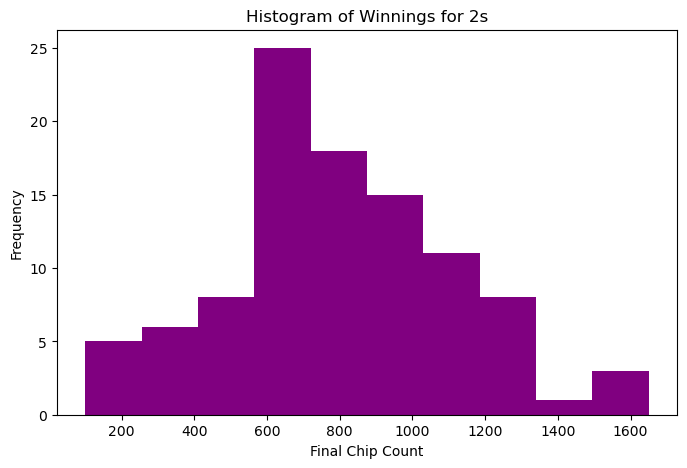

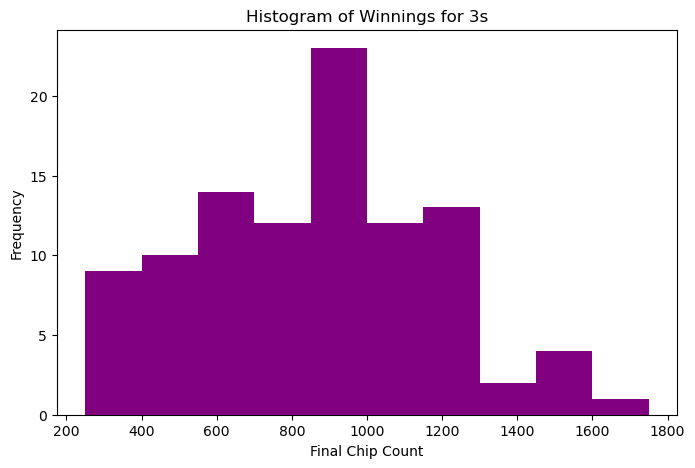

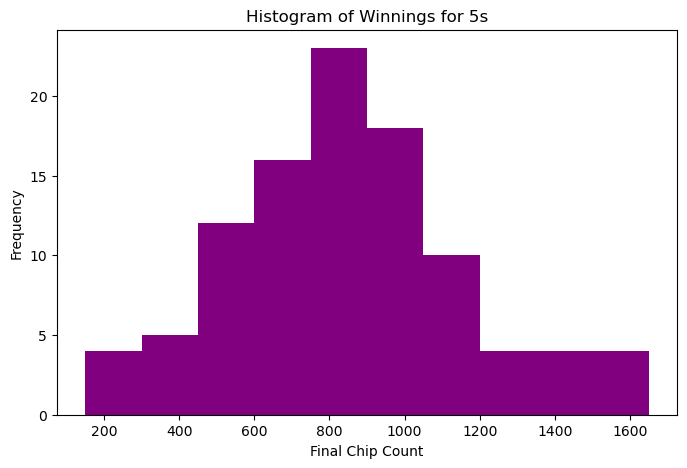

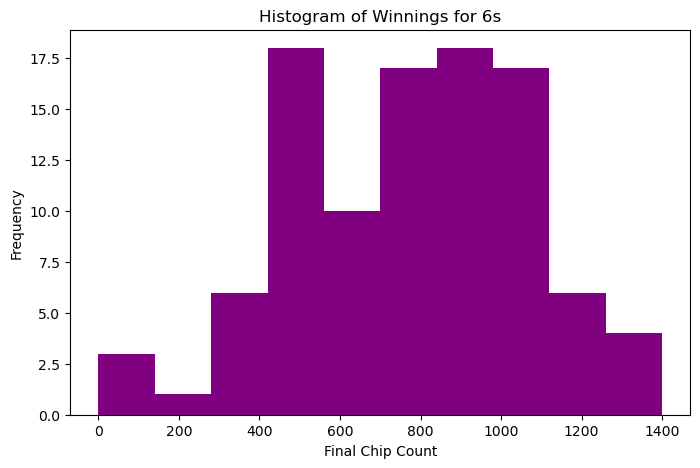

In [198]:
def plot_histograms(results):
    import matplotlib.pyplot as plt

    labels = ["2s", "3s", "5s", "6s"]
    for i in range(4):
        plt.figure(figsize=(8, 5))
        plt.hist(results[i], bins=10, color='purple')
        plt.xlabel("Final Chip Count")
        plt.ylabel("Frequency")
        plt.title(f"Histogram of Winnings for {labels[i]}")
        plt.show()

plot_histograms(results2356)


In [199]:
import numpy as np
labels = ["2", "3", "5", "6"]

for i in range(4):
    results=results2356[i]
    print(results[0:5])
    finals=np.array(results)
    net_winnings=finals-1000

    averagewinperROUND=np.mean(net_winnings)/50
    std_dev = np.std(net_winnings)

    win_prob = np.sum(net_winnings > 0) / 100
    lose_prob = 1-win_prob
    print(f"Results for limit at {labels[i]}:\n~~~~~~~~~~~\n~~~~~~~~~~~")
    print(f"Average winnings PER ROUND: {averagewinperROUND}")
    print(f"Standard deviation of final totals: {std_dev:.2f}")
    print(f"Probability of winning: {win_prob}")
    print(f"Probability of losing: {lose_prob}\n\n")

[400, 1100, 250, 500, 800]
Results for limit at 2:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: -3.94
Standard deviation of final totals: 309.02
Probability of winning: 0.23
Probability of losing: 0.77


[900, 1050, 250, 900, 600]
Results for limit at 3:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: -3.3
Standard deviation of final totals: 325.85
Probability of winning: 0.28
Probability of losing: 0.72


[650, 1100, 250, 400, 1650]
Results for limit at 5:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: -3.55
Standard deviation of final totals: 314.27
Probability of winning: 0.22
Probability of losing: 0.78


[650, 1350, 500, 750, 800]
Results for limit at 6:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: -4.69
Standard deviation of final totals: 296.87
Probability of winning: 0.2
Probability of losing: 0.8




10. Create a new strategy based on web searches or your own ideas. Demonstrate that the new strategy will result in increased or decreased winnings. 

In [227]:
class Player1(Player):
    #Hi/Low
    def __init__(self, name, chips=1000, X=4, Y=-4, high_count_hand=12, low_count_hand=18):
        super().__init__(name, chips)
        self.count = 0
        self.X = X  # Threshold for high count
        self.Y = Y  # Threshold for low count
        self.high_count_hand = high_count_hand
        self.low_count_hand = low_count_hand
        
    def update_count(self, card):
        while card is None:  # Plastic card was drawn, meaning deck reshuffled
            print("Deck reshuffled! Resetting counts.")
            for player in self.card_counters:
                player.count = 0
                print(f"{player.name}'s count reset.")
                
            
        if card.rank in ['2', '3', '4', '5', '6']:
            self.count += 1
        elif card.rank in ['10', 'J', 'Q', 'K', 'A']:
            self.count -= 1
        print ("current count:",self.count)
        
    def hit_or_stay(self, deck):
        if self.count >= self.X:
            return self.hand_value() < self.high_count_hand
        elif self.count <= self.Y:
            return self.hand_value() < self.low_count_hand
        else:
            return self.hand_value() < 16
        
class Player2(Player):
    #50/50 over 16
    def hit_or_stay(self, deck):
        return self.hand_value() < 16 or random.choice([True, False])
    
class Player3(Player):
    #Cheater
    def hit_or_stay(self, deck):
        next_card = deck.cards[-1]  # Peek at the next card
        if next_card.value==11:
            return (self.hand_value() + 11) <=21 or (self.hand_value()+1)<=21
        else:
            return self.hand_value() + next_card.value <= 21

class PlayerD(Player):
    #dealer strat
    def hit_or_stay(self, deck):
        return self.hand_value() < 17
 

class BlackjackGame:
    def __init__(self, decks=6, num_players=1, human_player=True):
        
        if not human_player and num_players < 1:
            raise ValueError("Error: At least one player must be present to start the game.")
        if num_players<0:
            raise ValueError("Error: You cannot have a negative number of players")
        
        ai_classes = {"1": PlayerD,# Dealer strategy 
                      "2": Player1,# Hi/Lo Card Counter
                        "3": Player2,# 50/50 over 16
                        "4": Player3 # Cheats
                     }
        self.deck = Deck(decks)
        self.deck.game = self
        self.card_counters = []
        self.deck.shuffle()
        self.players = []
        self.dealer = Player("Dealer")
        self.human_player = human_player
        self.dealer_card= []
        
        #self, name, chips=1000, X=8, Y=-8, high_count_hand=12, low_count_hand=18
        self.players.append(Player1("High/low3",X=3, Y=-3, high_count_hand=12, low_count_hand=18))
        self.players.append(Player2("50/50 when over 16"))
        self.players.append(Player3("Cheater"))
        self.players.append(PlayerD("Dealer Strat"))
        self.card_counters.append(Player1("High/low3"))

        if human_player:
            self.players.insert(0, Player("You"))

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                card=self.deck.draw_card()
                player.receive_card(card)
                self.update_counts(card)
        self.dealer_card = self.deck.draw_card()    
        self.dealer.receive_card(self.dealer_card)
        self.update_counts(self.dealer_card)
        self.dealer_card = self.deck.draw_card()
        self.dealer.receive_card(self.dealer_card)
        #time.sleep(1)
        print("-----------")
            
    def update_counts(self, card):
        for player in self.card_counters:
            player.update_count(card)

    def display_table(self, show_dealer=False):
        print("\nDealer's Hand:")
        if show_dealer:
            print(self.dealer.show_hand(), f"({self.dealer.hand_value()})")
        else:
            print("  Showing",self.dealer.hand[0], "|| Total: (??)")

        for player in self.players:
            print(f"{player.name}'s Hand:\n   {player.show_hand()} || Total: ({player.hand_value()})")

    def player_turn(self, player):
        while player.hand_value() < 21:
            if player.name == "You":
                action = input(f"---------------------\nYou're currently at {player.hand_value()}. Dealer is showing {self.dealer.hand[0]}, \nDo you want to hit (h) or stand (s)? ").lower()
            else:
                action = "h" if player.hit_or_stay(self.deck) else "s"
            
            if action != "h" and action != "s":
                print ("That is not a proper response, please enter either 'h' or 's' only.")
                
            elif action == "h":
                card = self.deck.draw_card()
                player.receive_card(card)
                print(f"{player.name} hits: {player.show_hand()} ({player.hand_value()})")
                
                self.update_counts(card)
                
                if player.hand_value() > 21:
                    print(f"{player.name} busted!")
                    break
                
            else:
                print(f"{player.name} chose stand.")
                break

    def dealer_turn(self):
        print("\nDealer's turn:")
        self.display_table(show_dealer=True)
        self.update_counts(self.dealer_card)
        while self.dealer.hand_value() < 17:
            #time.sleep(1)
            self.dealer_card=self.deck.draw_card()
            self.update_counts(self.dealer_card)
            self.dealer.receive_card(self.dealer_card)
            
            print(f"Dealer hits: {self.dealer.show_hand()} ({self.dealer.hand_value()})")

        if self.dealer.hand_value() > 21:
            #time.sleep(1)
            print("Dealer busts!")

    def determine_winners(self):
        dealer_value = self.dealer.hand_value()
        print("\n~~~~~~~~~~~~~~~~\n~~~~~~~~~~~~~~~~\nResults:\n----------------")
        for player in self.players:
            player_value = player.hand_value()
            if player_value > 21:
                print(f"{player.name} busts and loses.")
                player.chips -= 50
            elif dealer_value > 21 or player_value > dealer_value:
                print(f"{player.name} wins!")
                player.chips += 50
            elif player_value < dealer_value:
                print(f"{player.name} loses.")
                player.chips -= 50
            else:
                print(f"{player.name} pushes.")
            print(f"{player.name} has {player.chips} chips.")
            if player.chips < 50:
                print(f"{player.name} no longer has enough chips for the ante")
            
        self.players= [player for player in self.players if player.chips>50]
        

    def reset_hands(self):
        for player in self.players + [self.dealer]:
            player.hand = []

    def play(self, num_rounds=1):
        for i in range(num_rounds):
            print(f"\n---------------------\n   Round {i+1} beginning:")
            print("")
            #for i in range(4):
                #print(3-i)
                #time.sleep(1)
            self.reset_hands()
            self.initial_deal()
            #self.display_table()

            # Player turns
            for player in self.players:
                self.player_turn(player)

            # Dealer's turn
            self.dealer_turn()

            # Determine winners
            self.determine_winners()
            if not self.players and not self.human_player:
                print("All players are out of chips. Game over!")
                return False  # Stops the game loop


In [228]:
def simulate_games(num_games=100, rounds_per_game=50):
    hi_low3 = []
    fiftyfifty = []
    cheats = []
    dealerstrat = []
    for game_num in range(num_games):
        print(f"\n~~~~~~~~~~~~~~~~~~~~~~~\nStarting Game {game_num + 1}...\n~~~~~~~~~~~~~~~~~~~~~~~")
        game = BlackjackGame(decks=6, num_players=4, human_player=False)
        game.play(num_rounds=rounds_per_game)
        
        try:
            hi_low3.append(game.players[0].chips)
        except:
            hi_low3.append(0)
        try:
            fiftyfifty.append(game.players[1].chips)
        except:
            fiftyfifty.append(0)
        try:
            cheats.append(game.players[2].chips)
        except:
            cheats.append(0)
        try:
            dealerstrat.append(game.players[3].chips)
        except:
            dealerstrat.append(0)
        

    return (hi_low3, fiftyfifty, cheats, dealerstrat)
resultsfinals=simulate_games()


~~~~~~~~~~~~~~~~~~~~~~~
Starting Game 1...
~~~~~~~~~~~~~~~~~~~~~~~
Shuffling deck

---------------------
   Round 1 beginning:

8 of Spades
remaining cards: 313
current count: 0
9 of Clubs
remaining cards: 312
current count: 0
4 of Spades
remaining cards: 311
current count: 1
5 of Spades
remaining cards: 310
current count: 2
7 of Clubs
remaining cards: 309
current count: 2
2 of Diamonds
remaining cards: 308
current count: 3
2 of Spades
remaining cards: 307
current count: 4
3 of Clubs
remaining cards: 306
current count: 5
4 of Diamonds
remaining cards: 305
current count: 6
4 of Clubs
remaining cards: 304
-----------
J of Hearts
remaining cards: 303
High/low3 hits: 8 of Spades, 7 of Clubs, J of Hearts (25)
current count: 5
High/low3 busted!
8 of Spades
remaining cards: 302
50/50 when over 16 hits: 9 of Clubs, 2 of Diamonds, 8 of Spades (19)
current count: 5
50/50 when over 16 chose stand.
3 of Clubs
remaining cards: 301
Cheater hits: 4 of Spades, 2 of Spades, 3 of Clubs (9)
current coun

Dealer hits: 2 of Spades, A of Hearts, 4 of Diamonds (17)

~~~~~~~~~~~~~~~~
~~~~~~~~~~~~~~~~
Results:
----------------
High/low3 wins!
High/low3 has 1150 chips.
50/50 when over 16 busts and loses.
50/50 when over 16 has 800 chips.
Cheater loses.
Cheater has 1100 chips.
Dealer Strat wins!
Dealer Strat has 1050 chips.

---------------------
   Round 26 beginning:

10 of Diamonds
remaining cards: 230
current count: -1
K of Hearts
remaining cards: 229
current count: -2
A of Clubs
remaining cards: 228
current count: -3
9 of Spades
remaining cards: 227
current count: -3
A of Hearts
remaining cards: 226
current count: -4
2 of Clubs
remaining cards: 225
current count: -3
K of Spades
remaining cards: 224
current count: -4
J of Clubs
remaining cards: 223
current count: -5
9 of Spades
remaining cards: 222
current count: -5
6 of Diamonds
remaining cards: 221
-----------
5 of Spades
remaining cards: 220
50/50 when over 16 hits: K of Hearts, 2 of Clubs, 5 of Spades (17)
current count: -4
50/50 when 

50/50 when over 16 hits: 7 of Hearts, A of Spades, 3 of Diamonds (21)
current count: 1
7 of Diamonds
remaining cards: 157
Cheater hits: 2 of Spades, J of Diamonds, 7 of Diamonds (19)
current count: 1
Cheater chose stand.
8 of Diamonds
remaining cards: 156
Dealer Strat hits: 9 of Clubs, 4 of Spades, 8 of Diamonds (21)
current count: 1

Dealer's turn:

Dealer's Hand:
6 of Spades, J of Hearts (16)
High/low3's Hand:
   5 of Diamonds, J of Spades, K of Diamonds || Total: (25)
50/50 when over 16's Hand:
   7 of Hearts, A of Spades, 3 of Diamonds || Total: (21)
Cheater's Hand:
   2 of Spades, J of Diamonds, 7 of Diamonds || Total: (19)
Dealer Strat's Hand:
   9 of Clubs, 4 of Spades, 8 of Diamonds || Total: (21)
current count: 0
7 of Spades
remaining cards: 155
current count: 0
Dealer hits: 6 of Spades, J of Hearts, 7 of Spades (23)
Dealer busts!

~~~~~~~~~~~~~~~~
~~~~~~~~~~~~~~~~
Results:
----------------
High/low3 busts and loses.
High/low3 has 500 chips.
50/50 when over 16 wins!
50/50 when

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



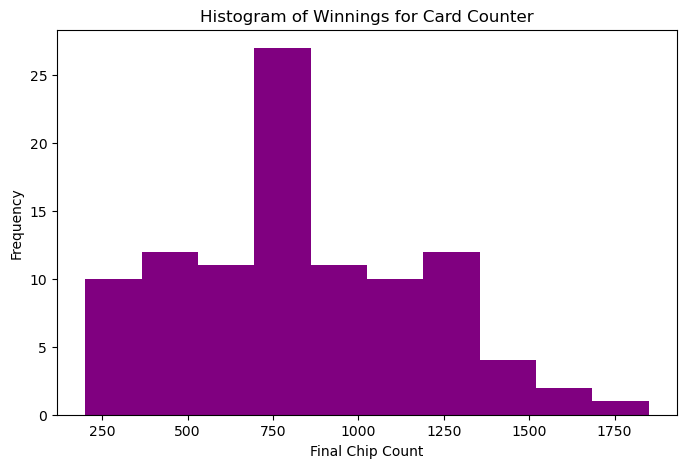

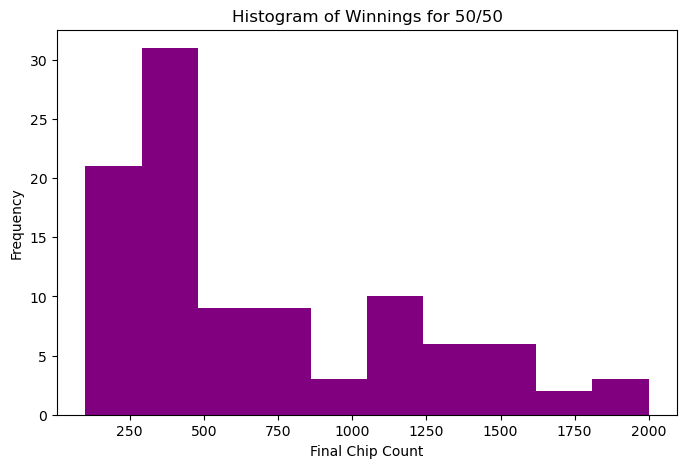

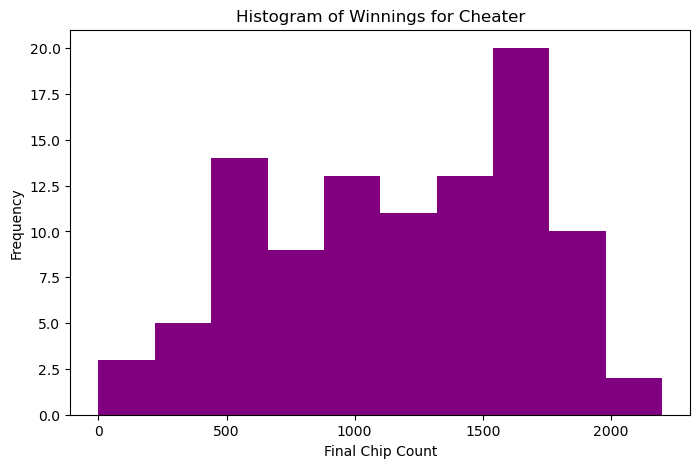

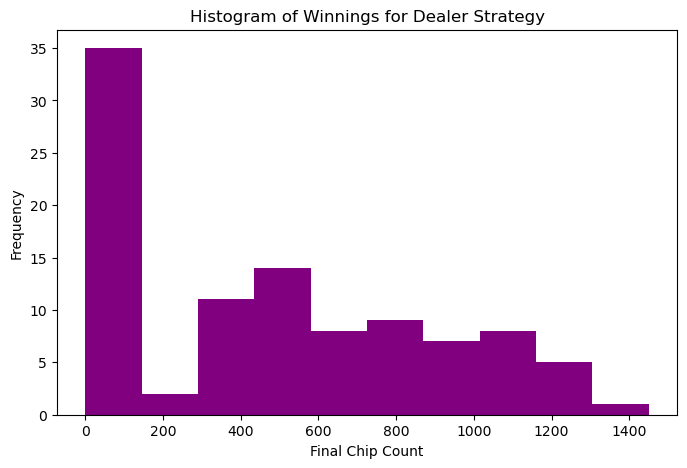

In [229]:
def plot_histograms(results):
    import matplotlib.pyplot as plt

    labels = ["Card Counter", "50/50", "Cheater", "Dealer Strategy"]
    for i in range(4):
        plt.figure(figsize=(8, 5))
        plt.hist(results[i], bins=10, color='purple')
        plt.xlabel("Final Chip Count")
        plt.ylabel("Frequency")
        plt.title(f"Histogram of Winnings for {labels[i]}")
        plt.show()

plot_histograms(resultsfinals)


In [230]:
import numpy as np
labels = ["Card Counter", "50/50", "Cheater", "Dealer Strategy"]

for i in range(4):
    results=resultsfinals[i]
    print(results[0:5])
    finals=np.array(results)
    net_winnings=finals-1000

    averagewinperROUND=np.mean(net_winnings)/50
    std_dev = np.std(net_winnings)

    win_prob = np.sum(net_winnings > 0) / 100
    lose_prob = 1-win_prob
    print(f"Results for limit at {labels[i]}:\n~~~~~~~~~~~\n~~~~~~~~~~~")
    print(f"Average winnings PER ROUND: {averagewinperROUND}")
    print(f"Standard deviation of final totals: {std_dev:.2f}")
    print(f"Probability of winning: {win_prob}")
    print(f"Probability of losing: {lose_prob}\n\n")

[1450, 1450, 1650, 900, 900]
Results for limit at Card Counter:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: -3.37
Standard deviation of final totals: 349.47
Probability of winning: 0.29
Probability of losing: 0.71


[550, 300, 300, 1400, 1000]
Results for limit at 50/50:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: -6.31
Standard deviation of final totals: 490.09
Probability of winning: 0.27
Probability of losing: 0.73


[0, 1800, 1700, 600, 650]
Results for limit at Cheater:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: 3.66
Standard deviation of final totals: 502.06
Probability of winning: 0.63
Probability of losing: 0.37


[0, 650, 1050, 0, 0]
Results for limit at Dealer Strategy:
~~~~~~~~~~~
~~~~~~~~~~~
Average winnings PER ROUND: -10.61
Standard deviation of final totals: 423.73
Probability of winning: 0.14
Probability of losing: 0.86


